# Importamos modulos

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.utils import resample
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import sweetviz as sv

# Analisis Exploratorio de Datos

**El dataset consiste en una gran data acumulada acerca de casos en los cuales los pacientes han tenido complicaciones al momento de realizarse una cirugía, los datos presentan informaión basica como lo puede llegar a ser la edad, el bmi, el genero, la raza, y tambien informacion de examanes medicos como los antecedentes medicos y las enfermedades que presenta el paciente, consta de un total de 25 caracteristicas y 14635 registros totales. A continuación se presenta  un analisis exploratorio de datos conformado por modulos de python y graficas que ayudaran con su interpretación.**

In [5]:
#leer el dataset
df = pd.read_csv('Surgical-deepnet.csv')
df.head()

,Unnamed: 0,Age,asa_status,baseline_cancer,baseline_charlson,baseline_cvd,baseline_dementia,baseline_diabetes,baseline_digestive,baseline_osteoart,...,complication_rsi,dow,gender,hour,month,moonphase,mort30,mortality_rsi,race,complication
0,19.31,59.2,1,1,0,0,0,0,0,0,...,-0.57,3,0,7.63,6,1,0,-0.43,1,0
1,18.73,59.1,0,0,0,0,0,0,0,0,...,0.21,0,0,12.93,0,1,0,-0.41,1,0
2,21.85,59.0,0,0,0,0,0,0,0,0,...,0.00,2,0,7.68,5,3,0,0.08,1,0
3,18.49,59.0,1,0,1,0,0,1,1,0,...,-0.65,2,1,7.58,4,3,0,-0.32,1,0
4,19.70,59.0,1,0,0,0,0,0,0,0,...,0.00,0,0,7.88,11,0,0,0.00,1,0


In [6]:
# Verificar si hay valores nulos
df.isnull().sum()

Unnamed: 0             0
Age                    0
asa_status             0
baseline_cancer        0
baseline_charlson      0
baseline_cvd           0
baseline_dementia      0
baseline_diabetes      0
baseline_digestive     0
baseline_osteoart      0
baseline_psych         0
baseline_pulmonary     0
ahrq_ccs               0
ccsComplicationRate    0
ccsMort30Rate          0
complication_rsi       0
dow                    0
gender                 0
hour                   0
month                  0
moonphase              0
mort30                 0
mortality_rsi          0
race                   0
complication           0
dtype: int64

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14635 entries, 0 to 14634
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Unnamed: 0           14635 non-null  float64
 1   Age                  14635 non-null  float64
 2   asa_status           14635 non-null  int64  
 3   baseline_cancer      14635 non-null  int64  
 4   baseline_charlson    14635 non-null  int64  
 5   baseline_cvd         14635 non-null  int64  
 6   baseline_dementia    14635 non-null  int64  
 7   baseline_diabetes    14635 non-null  int64  
 8   baseline_digestive   14635 non-null  int64  
 9   baseline_osteoart    14635 non-null  int64  
 10  baseline_psych       14635 non-null  int64  
 11  baseline_pulmonary   14635 non-null  int64  
 12  ahrq_ccs             14635 non-null  int64  
 13  ccsComplicationRate  14635 non-null  float64
 14  ccsMort30Rate        14635 non-null  float64
 15  complication_rsi     14635 non-null 

In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,14635.0,31.295642,8.152709,2.150000,26.510000,28.980000,35.295000,92.590000
Age,14635.0,63.205268,18.088191,6.100000,51.500000,59.700000,74.700000,90.000000
asa_status,14635.0,0.632320,0.539952,0.000000,0.000000,1.000000,1.000000,2.000000
baseline_cancer,14635.0,0.262316,0.439909,0.000000,0.000000,0.000000,1.000000,1.000000
baseline_charlson,14635.0,0.977520,1.758355,0.000000,0.000000,0.000000,2.000000,13.000000
baseline_cvd,14635.0,0.620294,0.485330,0.000000,0.000000,1.000000,1.000000,1.000000
baseline_dementia,14635.0,0.004851,0.069485,0.000000,0.000000,0.000000,0.000000,1.000000
baseline_diabetes,14635.0,0.120875,0.325993,0.000000,0.000000,0.000000,0.000000,1.000000
baseline_digestive,14635.0,0.189546,0.391955,0.000000,0.000000,0.000000,0.000000,1.000000
baseline_osteoart,14635.0,0.342740,0.474642,0.000000,0.000000,0.000000,1.000000,1.000000


Done! Use 'show' commands to display/save.   |██████████| [100%]   00:00 -> (00:00 left)



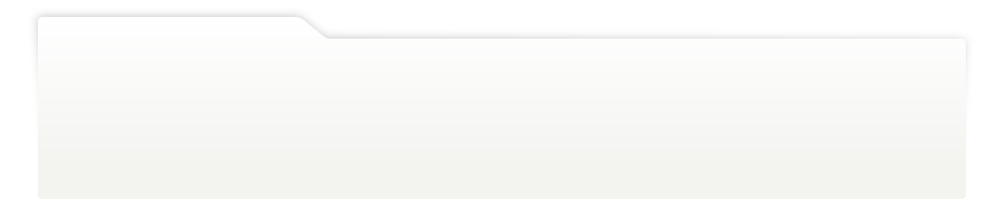
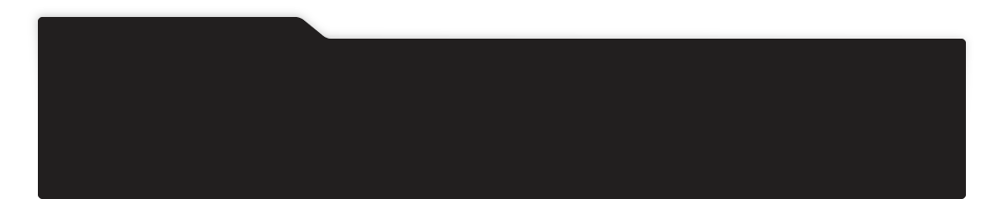
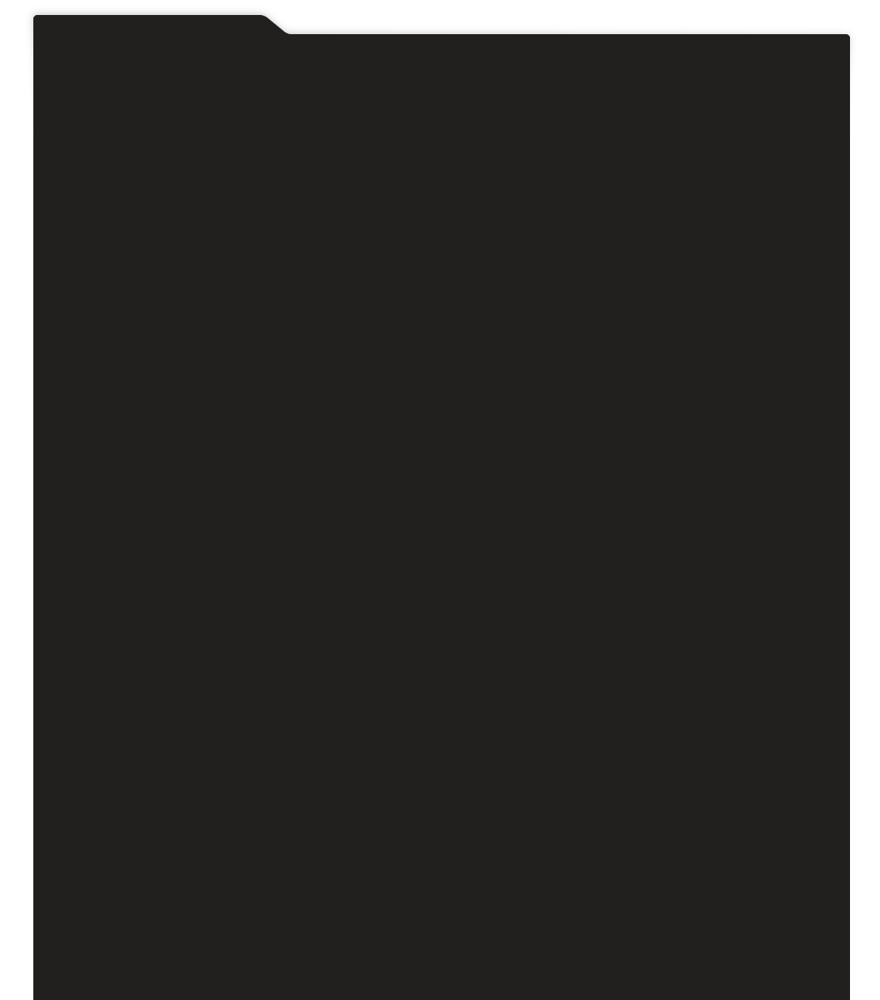
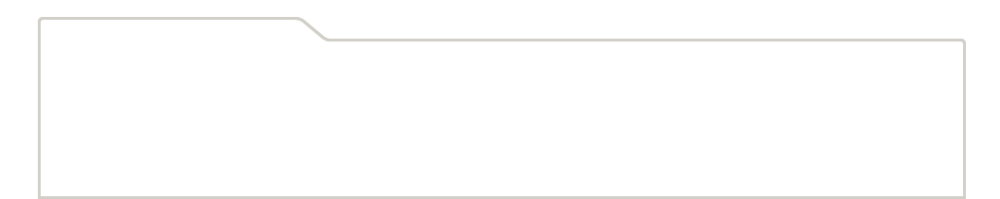
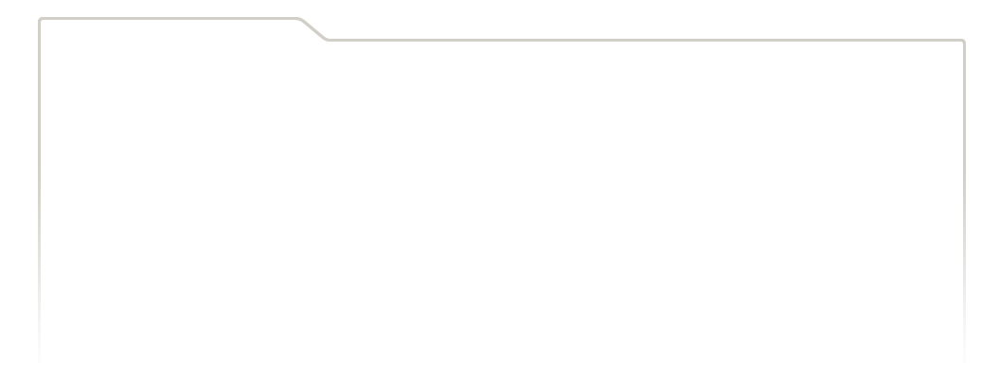
...
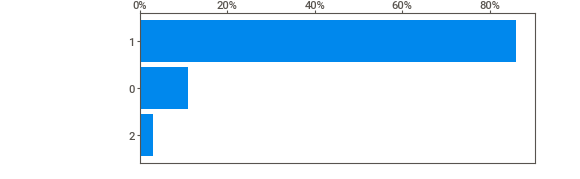
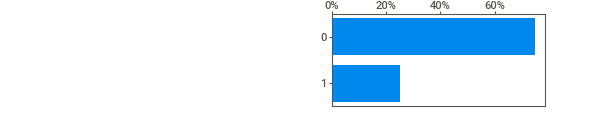
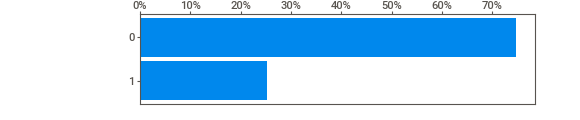
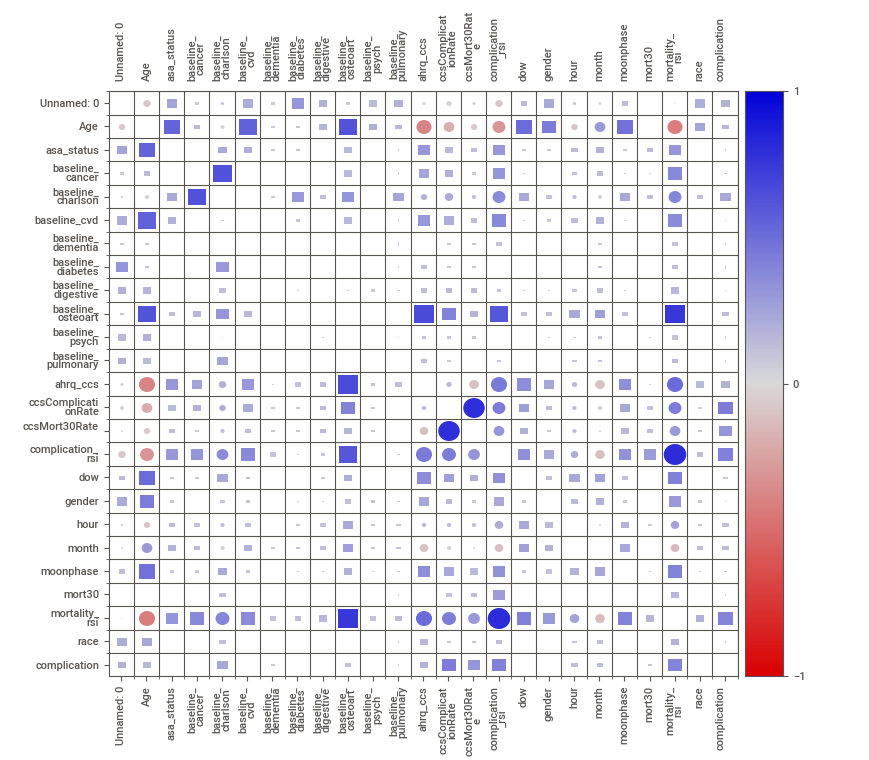
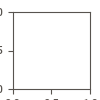

In [9]:
#Se realiza un reporte rapido de los datos con el modulo sweetviz, el cual nos permite ver de manera rapida
# las relaciones entre las variables y la distribucion de los datos,
# ademas de poder ver los datos estadisticos de cada variable
# finalmente se realiza un proceso manual de seleccionar las graficas que nos interesan
# para ser interpretadas con mayor detalle en el informe y conclusiones finales.
report = sv.analyze(df)
report.show_notebook()

In [10]:
# Seleccionar las columnas que se van a utilizar en X y Y
y = df['complication'].copy()
X = df.drop('complication', axis=1).copy()

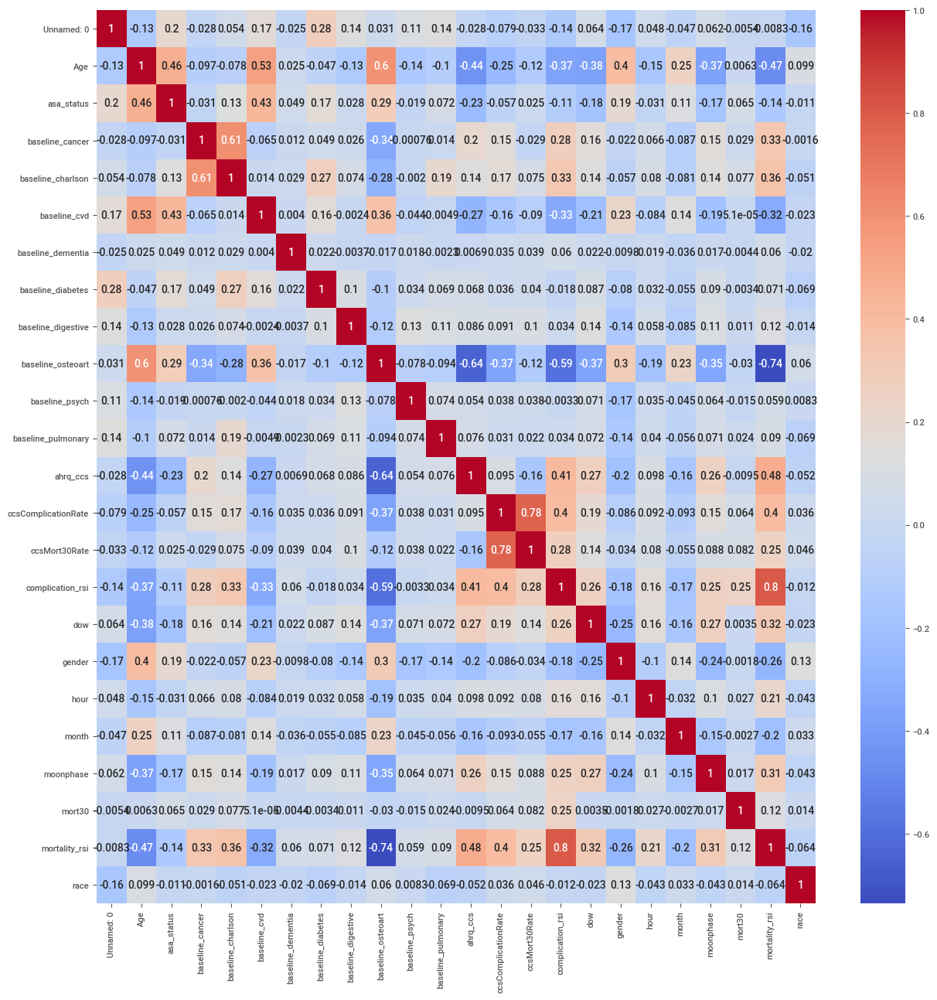

In [11]:
# matriz de correlación
corr = X.corr()
plt.figure(figsize=(15,15))
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.show()

**Se puede observar que hay alta correlacion con algunas variables como el caso de la columna 'complication_rsi', sin embargo se ha optado por dejar todas las variables en el modelo.**

In [12]:
#graficas todos los diagramas de caja
fig = px.box(X)
fig.show()


print('Se puede acercar la grafica para ver los datos')

Se puede acercar la grafica para ver los datos


**Como se puede observar se presentan muchos outliers y mas en las variables bmi y Age, pero debido al contexto que se tratan de datos de pacientes y se necesiota detectar los riesgos de complicaciones, se ha optado por dejarlos en el modelo, dada su importancia**

In [13]:
#Dividir el dataset en train y test
X_train, X_test, y_train, y_test = train_test_split(X,y,stratify=y,train_size=0.8,test_size=0.2,random_state=0)

In [14]:
# Se equilibra el dataset con la técnica de resampling, obteniendo 0 y 1 en la misma proporción
# para evitar el sesgo de los datos

# Clase mayoritaria
X_train_maj=X_train[y_train==0]
y_train_maj=y_train[y_train==0]

# Clase minoritaria
X_train_min=X_train[y_train==1]
y_train_min=y_train[y_train==1]

# Se balancea el dataset
X_train_under, y_train_under = resample(X_train_maj, y_train_maj, n_samples=len(y_train[y_train==1]), random_state=0)

# Se concatena el dataset balanceado con el dataset minoritario
X_train_under=np.concatenate((X_train_under, X_train_min), axis=0)
y_train_under=np.concatenate((y_train_under, y_train_min), axis=0)

print(pd.Series(y_train_under).value_counts())

1    2952
0    2952
dtype: int64


In [15]:
# Se escalan los datos
scaler = StandardScaler()
X_train_under = scaler.fit_transform(X_train_under)
X_test = scaler.transform(X_test.values)
X_train = scaler.transform(X_train.values)


# Creacion de modelos

### Modelo datos balanceados

In [16]:
# Se crea el modelo de regresión logística
model = LogisticRegression()
model.fit(X_train_under, y_train_under)

# Se obtienen las predicciones
y_pred = model.predict(X_test)

# Se obtienen las métricas
print('Accuracy: ', accuracy_score(y_test, y_pred))
print('Precision: ', precision_score(y_test, y_pred))
print('Recall: ', recall_score(y_test, y_pred))
print('F1: ', f1_score(y_test, y_pred))

Accuracy:  0.730440724291083
Precision:  0.47799827437446074
Recall:  0.7506775067750677
F1:  0.5840801265155507


In [17]:
# Se obtiene el reporte de clasificación
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.90      0.72      0.80      2189
           1       0.48      0.75      0.58       738

    accuracy                           0.73      2927
   macro avg       0.69      0.74      0.69      2927
weighted avg       0.79      0.73      0.75      2927



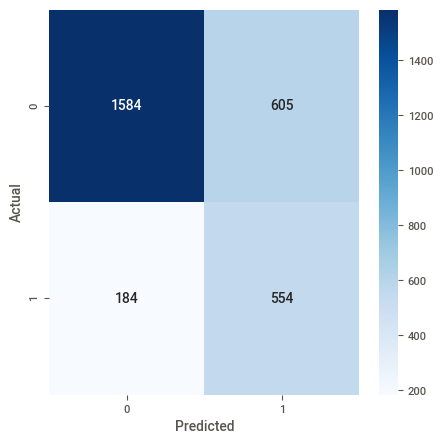

In [18]:
# Se obtiene la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Se grafica la matriz de confusión
fig, ax = plt.subplots(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

### Modelo datos NO balanceados

In [19]:
#Se crea otro modelo con los datos sin balancear
model2 = LogisticRegression()
model2.fit(X_train, y_train)

# Se obtienen las predicciones
y_pred2 = model2.predict(X_test)

# Se obtienen las métricas
print('Accuracy: ', accuracy_score(y_test, y_pred2))
print('Precision: ', precision_score(y_test, y_pred2))
print('Recall: ', recall_score(y_test, y_pred2))
print('F1: ', f1_score(y_test, y_pred2))


Accuracy:  0.8011615989067304
Precision:  0.7
Recall:  0.3699186991869919
F1:  0.48404255319148937


In [20]:
# Se obtiene el reporte de clasificación
print(classification_report(y_test, y_pred2))

              precision    recall  f1-score   support

           0       0.82      0.95      0.88      2189
           1       0.70      0.37      0.48       738

    accuracy                           0.80      2927
   macro avg       0.76      0.66      0.68      2927
weighted avg       0.79      0.80      0.78      2927



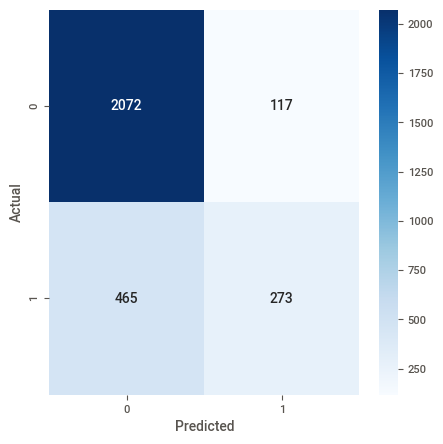

In [21]:
# Se obtiene la matriz de confusión
cm2 = confusion_matrix(y_test, y_pred2)
# Se grafica la matriz de confusión
fig, ax = plt.subplots(figsize=(5,5))
sns.heatmap(cm2, annot=True, fmt='d', cmap='Blues', ax=ax)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()


### Modelo GridSeacrh

In [22]:
# Se crea el modelo de regresión logística con GridSearchCV y datos sin balancear
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

# Se crea el modelo
model3 = LogisticRegression()

# Se crea el diccionario con los parámetros
param_grid = {'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000], 'penalty': ['l2'], 'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']}
grid = GridSearchCV(model3, param_grid, cv=5, scoring='recall') #debido a que es importante que nos interesa saber si se tiene una complicación al momento de realizar la cirugía, se utiliza recall

# Se entrena el modelo
grid.fit(X_train, y_train)

# Se obtienen los mejores parámetros
print(grid.best_params_)
print(grid.best_score_)



{'C': 0.001, 'penalty': 'l2', 'solver': 'liblinear'}
0.4027772520003441


In [23]:
# Se obtienen las predicciones
y_pred3 = grid.predict(X_test)

# Se obtienen las métricas
print('Accuracy: ', accuracy_score(y_test, y_pred3))
print('Precision: ', precision_score(y_test, y_pred3))
print('Recall: ', recall_score(y_test, y_pred3))
print('F1: ', f1_score(y_test, y_pred3))

Accuracy:  0.7974034847967202
Precision:  0.6579520697167756
Recall:  0.4092140921409214
F1:  0.5045948203842942


In [24]:
# Se obtiene el reporte de clasificación
print(classification_report(y_test, y_pred3))

# Se obtiene la matriz de confusión
cm3 = confusion_matrix(y_test, y_pred3)

              precision    recall  f1-score   support

           0       0.82      0.93      0.87      2189
           1       0.66      0.41      0.50       738

    accuracy                           0.80      2927
   macro avg       0.74      0.67      0.69      2927
weighted avg       0.78      0.80      0.78      2927



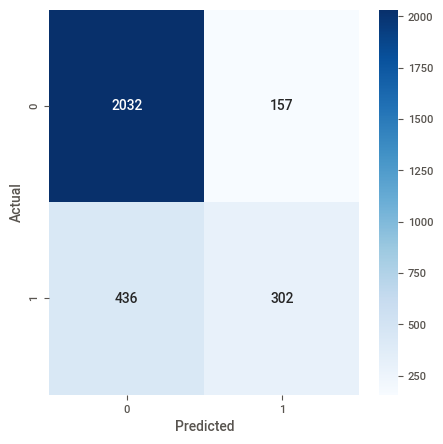

In [25]:
# Se grafica la matriz de confusión
fig, ax = plt.subplots(figsize=(5,5))
sns.heatmap(cm3, annot=True, fmt='d', cmap='Blues', ax=ax)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

### Modelo Regresion Logistica C++

In [26]:
#Se recrea la matriz de confusión con los datos de c++ para comparar
tn= 1554
fp= 635
fn= 201
tp= 571
print(tn, fp, fn, tp)

1554 635 201 571


In [27]:
#Metricas del modelo de c++ con datos sin balancear
print('Accuracy: ', (tn+tp)/(tn+fp+fn+tp))
print('Precision: ', tp/(tp+fp))
print('Recall: ', tp/(tp+fn))
print('F1: ', 2*tp/(2*tp+fp+fn))

Accuracy:  0.7176629517055049
Precision:  0.4734660033167496
Recall:  0.7396373056994818
F1:  0.5773508594539939


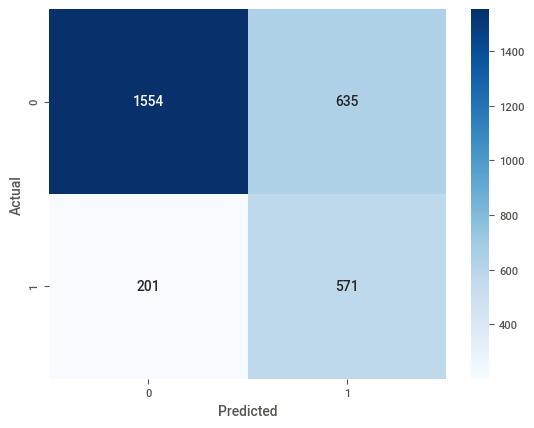

In [28]:
#grafica matriz de confusión

sns.heatmap([[tn, fp], [fn, tp]], annot=True, fmt='d', cmap='Blues')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()


# comparacion de modelos

**EL mejor modelo realizado en python es el modelo de regresion logistica proveniente del modelo de GridSearch, y con datos sin balancear con un Accuracy de 0.79**

**Por lo tanto vamos a usar este modelo, para compararlo con el modelo mas optimo de c++**

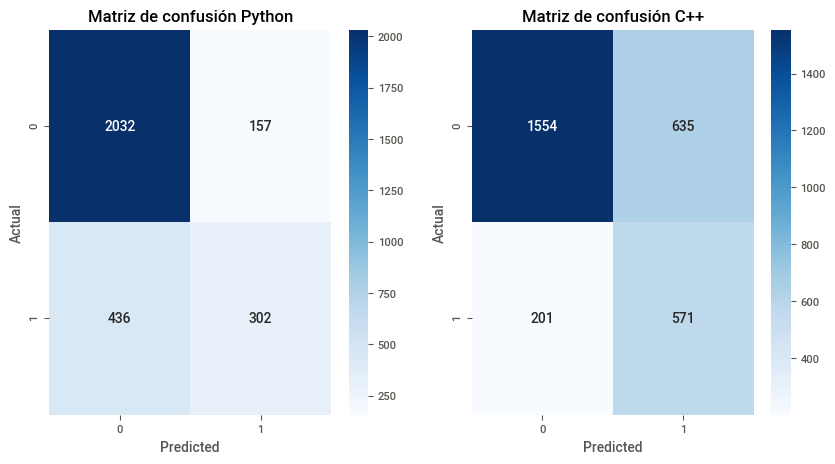

In [29]:
#subplot de la matriz de confusión de python y c++
fig, ax = plt.subplots(1, 2, figsize=(10,5))
sns.heatmap(cm3, annot=True, fmt='d', cmap='Blues', ax=ax[0])
ax[0].set_ylabel('Actual')
ax[0].set_xlabel('Predicted')
ax[0].set_title('Matriz de confusión Python')
sns.heatmap([[tn, fp], [fn, tp]], annot=True, fmt='d', cmap='Blues', ax=ax[1])
ax[1].set_ylabel('Actual')
ax[1].set_xlabel('Predicted')
ax[1].set_title('Matriz de confusión C++')
plt.show()


In [30]:
#Dataframe con las metricas de los modelos de python y c++
df = pd.DataFrame({'Modelo': ['Python', 'C++'], 'Accuracy': [accuracy_score(y_test, y_pred3), (tn+tp)/(tn+fp+fn+tp)], 'Precision': [precision_score(y_test, y_pred3), tp/(tp+fp)], 'Recall': [recall_score(y_test, y_pred3), tp/(tp+fn)], 'F1': [f1_score(y_test, y_pred3), 2*tp/(2*tp+fp+fn)]})
df


,Modelo,Accuracy,Precision,Recall,F1
0,Python,0.797403,0.657952,0.409214,0.504595
1,C++,0.717663,0.473466,0.739637,0.577351


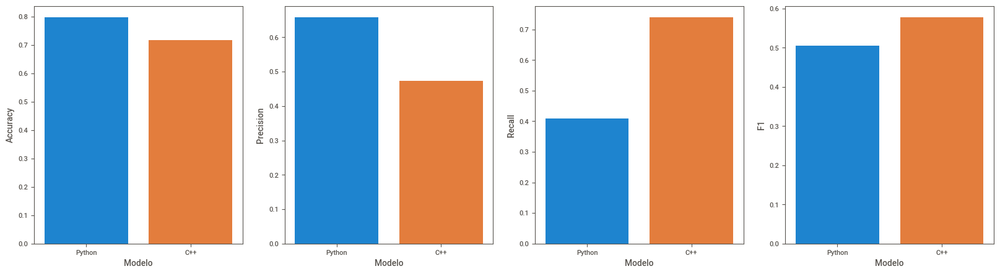

In [31]:
#graficas de las metricas de los modelos de python y c++
fig, ax = plt.subplots(1, 4, figsize=(20,5))
sns.barplot(x='Modelo', y='Accuracy', data=df, ax=ax[0])
sns.barplot(x='Modelo', y='Precision', data=df, ax=ax[1])
sns.barplot(x='Modelo', y='Recall', data=df, ax=ax[2])
sns.barplot(x='Modelo', y='F1', data=df, ax=ax[3])
plt.show()


# Analisis y Recomendaciones

**- Como se puede evidenciar el modelo de python es mejor al momento de evaluar metricas como accuracy o precision, sin embargo el modelo de C++ es mejor en el caso de recall, por lo que se puede concluir que el modelo de C++ es mejor para este dataset, debido a que el recall es la metrica seleccionada como la mejor metrica de rendimiento, ya que nos permite evaluar el riesgo al momento de realizarle la operacion a un paciente**.

**- Al momento de contabilizar el tiempo de ejecucion del algoritmo, nos encontramos con que el de python es mas rapido en este caso, debido a que no se esta usando el algoritmo de optimización de descenso del gradiente el cual permite deacuerdo a varios parametros disminuir el margen de error, y esto toma tiempo de computo, sin embargo al ser realizado en C++ permite mayor velocidad, que si fuera totalmente hehco en python.**

**- Las buenas practicas indican siempre intentar hacer lo mismo de varias maneras obteniendo resultados diferentes, a veces mejores o peores. Adicionalmente para este problema se implementaron varias formas de hacer lo mismo, (algoritmo de clasificación regresion logistica) los resultados variaron debido a factores como el lenguaje de programación usado, los parametros de optimización, la cantidad de datos, etc. y al final mediante el uso de metricas de rendimiento se pudo confirmar el mejor modelo, en este caso se tuvo en cuenta la metrica de recall y accuracy, debido a que nos interesa saber si un paciente puede sufrir complicaciones al momento de ser operado, es mejor no operar a un paciente que operarlo y que tenga altos indices de complicaciones medicas**.

**- El algoritmo de regreseion logistica nos permite mediante tecnicas/formulas matematicas clasificar correctamente clases, en este caso si un paciente tendrá complicaciones medicas o no al momento de realizar una cirugia, este algoritmo presenta varios parametros como lo pueden llegar a ser la regularización, la tasa de aprendizaje, etc. para realizar multiples pruebas se recomienda hacer uso de GridSearch, el cual consiste en unas pruebas del modelo y el dataset aplicando varias combinaciones de parametros, obteniendo finalmente el mejor resultado, dependiendo de la metrica que se escoja para medir el rendimiento.**



# Conclusiones

**Se puede concluir que el lenguaje de programación c++ requiere mas trabajo por parte del programador para desarrollar un algoritmo tan complejo como lo es la regresion logistica, llegando a hacer funcion por funcion, ademas de ser un poco mas 'rudo' al momento de las variables, sin embargo al final se obtiene la recompensa de un algoritmo con ejecucion muy rapida, y que se tiene absoluto control sobre todo lo que se esta haciendo, llegando a crear las funciones con los parametros que queramos y manejando las variables de una manera mas moldeable a la situacion que se nos llegue a presentar**

**El dataset se tiene que normalizar debido a la dispersion de los datos, representado en el grafico de caja, algunas variables presentan valores muy dispersos debido a la cantidad de pacientes y la diversidad de los mismo**

**Los outliers no fueron eliminados debido a que representan la variedad de pacientes que pueden llegar a estar en un futuro, es decir datos que aun no se tienen en consideración, si se eliminan se estaría realizando un sobreajuste 'overfitting' lo cual llevaria a que el modelo no funcione bien con datos de pacientes que no representen o esten cerca de la media de cada caracteristicas con el cual fue entrenado el modelo**

**Se aplicaron todos los conocimientos adquiridos en las diferentes materias cursadas, pero sobre todo la materia de HPC fue fundamental para asi aplicar los conocimientos de c++ y metricas de rendimiento al momento de comparar diferentes modelos y lenguajes de programacion al momento de resolver un mismo problema.**

**Es importante el uso de herramientas como los modulos de python para implementar de una manera rapida algunas funciones, como lo pueden llegar a ser (LOgisticRegression, Train_test_split, GridSearchCV, etc...). Sin embargo es mas importante aún como ingenieros aprender sobre las bases en la que fueron hechas, entender la logica, la teoria y la matematica que hay detras de cada una con el objetivo de modelar el problema y aplicar la mejor solución.**

**En la mayoria de casos los datos deben ser balanceados, para obtener la misma cantidad de predicciones de la clase A y la clase B, sin embargo y como quedo demostrado tras realiar experimenos, los mejores resultados para este dataset y problema fueron obtenidos al trabajar con datos sin balancear.**

**Es importante saber la diferencia entre las metricas y su finalidad, después de todo es la manera de medir el rendimiento de un modelo, en este caso la mejor metrica que se escogío fue recall, debido a que nos permite saber de manera directa de cuantos pacientes que tendran complicaciones, se predijeron de manera precisa minimizando el erro de poder operar a alguien que pueda presentar un alto riesgo, en este problema es mejor tener una alta tasa de Falsos positivos que de falsos negativos, ya que son vidas humanas las que dependeran de este algoritmo.**

**Las graficas son una manera muy facil y didactica de mostrar grandes volumenes de información, a veces oculto por la cantidad de datos que muchas veces son olidados muy facil, es por eso que es importante tener un gran conocimiento sobre las graficas y sus descripciones,'una imagen dice mas que mil palabras'.**

**Pese a tener muchas caracteristicas y algunas pudieron llegar a ser descartables, no se descartaron, debido a que se obtuvieron grandes resultados, encontrando correlación entre la variables a predecir y los predictores, despues de todo es información de cada paciente que llegerá a estar en esta situación, por lo tanto es mejor tener grandes volumenes de datos, de esta manera en un futuro se podrá encontrar similitudes entre pacientes da pesar de la diversidad con la que podemos llegar a contar.**

**Qt representa un gran IDE al momento de trabajar con el lenguaje de programación C++, debido a que sencillo y ayuda al momento de usar su gestor de fichero y haciendo uso del makefile, se obtiene una herramienta ideal para un lenguaje de programación rustico o anticuado para algunas personas que no estan tan familiarizados con este lenguaje de programación.**

**El proceso de analitica y limpieza de datos es muy importante al momento de empezar con la creación del codigo, debido a que nos permite familiarizarnos mas con el dataset, descubriendo cosas que no se pueden ver a simple vista, muchas veces son relaciones o datos anomalos interesantes, este datset no presento nada fuera de lo normal, pero igual es importante realizar un analisis exhaustivo del conjunto de datos que se esta trabajando.**

# Referencias

* https://github.com/MonsieurLundi/Logistic-Regression (Datos)

* https://www.kaggle.com/datasets/omnamahshivai/surgical-dataset-binary-classification (Datos)

* https://conceptosclaros.com/que-es-regresion-logistica/ (modelo)

* https://sitiobigdata.com/2019/01/19/machine-learning-metrica-clasificacion-parte-3/ (metricas)

* https://matplotlib.org/stable/gallery/index (graficas)

* https://www.w3schools.com/cpp/default.asp (C++)

* https://www.geeksforgeeks.org/difference-between-python-and-c/ (comparacion y rendimiento)